<a href="https://colab.research.google.com/github/docheem/NLP-Portfolio/blob/main/PR_Adv_Recommendation_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Enhancing E-commerce by Building an Advanced Search Engine and Recommendation System

We aim to build an advanced search and recommender system that can search and recommend products based on the 'flipkart_com-ecommerce_sample.csv', an e-commerce data set.

Our main aim is to recommend the products or items based on users’ historical interests. A recommendation engine uses different algorithms and recommends the most relevant items to the users. It initially captures the past behavior of the users. It recommends products based on that.




In [ ]:
#Importing modules to perform EDA

# Data Manipulation
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import string

# NLP for text pre-processing
%matplotlib inline
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')


import scipy
import re
from scipy import spatial
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import PorterStemmer
tokenizer = ToktokTokenizer()

# other libraries
import gensim
from gensim.models import Word2Vec
import itertools
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
# Import linear_kernel
from sklearn.metrics.pairwise import linear_kernel
# remove warnings
import warnings
warnings.filterwarnings(action = 'ignore')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


The project aims to use deep learning techniques for information retrieval rather than the traditional word comparison approach to get better results. Also, it focuses on recommender systems that are everywhere and creates personalized recommendations to increase the user experience.
The methodology involves the following steps.
1. Data understanding
2. Preprocessing
3. Feature selection
4. Model building
5. Returning search queries
6. Recommending product

In [ ]:
import pandas as pd
from nltk.tokenize import word_tokenize


# loading the datset from the drive
path = '/content/drive/MyDrive/DAtasets/flipkart_com-ecommerce_sample.csv'

Sengine_df = pd.read_csv(path)


Sengine_df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32157.0,22646.0,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,220.0,210.0,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."


#Exploratory Data Analysis

The data set has 15 attributes out of these labels, and we need the product name and description to complete this project.

In [ ]:
Sengine_df['description'][1]

"FabHomeDecor Fabric Double Sofa Bed (Finish Color - Leatherette Black Mechanism Type - Pull Out) Price: Rs. 22,646 • Fine deep seating experience • Save Space with the all new click clack Sofa Bed • Easy to fold and vice versa with simple click clack mechanism • Chrome legs with mango wood frame for long term durability • Double cushioned Sofa Bed to provide you with extra softness to make a fine seating experience • A double bed that can easily sleep two,Specifications of FabHomeDecor Fabric Double Sofa Bed (Finish Color - Leatherette Black Mechanism Type - Pull Out) Installation & Demo Installation & Demo Details Installation and demo for this product is done free of cost as part of this purchase. Our service partner will visit your location within 72 business hours from the delivery of the product. In The Box 1 Sofa Bed General Brand FabHomeDecor Mattress Included No Delivery Condition Knock Down Storage Included No Mechanism Type Pull Out Type Sofa Bed Style Contemporary & Modern 

In [ ]:
Sengine_df.shape

(20002, 15)

In [ ]:
Sengine_df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [ ]:
Sengine_df.size

300030

In [ ]:
Sengine_df.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product     object
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [ ]:
Sengine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20002 entries, 0 to 20001
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  20000 non-null  object 
 1   crawl_timestamp          20000 non-null  object 
 2   product_url              20000 non-null  object 
 3   product_name             20000 non-null  object 
 4   product_category_tree    20000 non-null  object 
 5   pid                      20000 non-null  object 
 6   retail_price             19922 non-null  float64
 7   discounted_price         19922 non-null  float64
 8   image                    19997 non-null  object 
 9   is_FK_Advantage_product  20000 non-null  object 
 10  description              19998 non-null  object 
 11  product_rating           20000 non-null  object 
 12  overall_rating           20000 non-null  object 
 13  brand                    14136 non-null  object 
 14  product_specifications

The data set has a total of 15 columns and 20,002 observations.


Summary Statistics

In [ ]:
#Univariate Analysis
Sengine_df.describe()

,retail_price,discounted_price
count,19922.000000,19922.000000
mean,2979.206104,1973.401767
std,9009.639341,7333.586040
min,35.000000,35.000000
25%,666.000000,350.000000
50%,1040.000000,550.000000
75%,1999.000000,999.000000
max,571230.000000,571230.000000


In [ ]:
# Adding a new column for the number of words
# in the description before text preprocessing.

pd.DataFrame(Sengine_df['description'].str.len())

,description
0,410.0
1,4433.0
2,650.0
3,403.0
4,248.0
...,...
19997,209.0
19998,210.0
19999,209.0
20000,NaN


In [ ]:
# Adding a new column
# counting the number of words in the "description" column
# for each row and assign it to a new column called "length"

Sengine_df['length'] = Sengine_df['description'].apply(lambda x: len(str(x).split()))


Text(0.5, 1.0, 'Word distribution per bin')

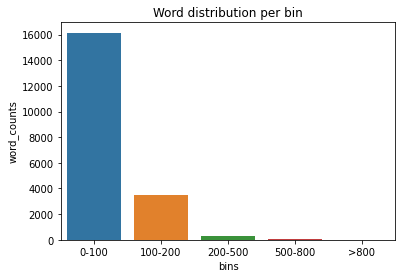

In [ ]:
# Ploting word distributions

bins = [0,50,75, np.inf]


Sengine_df['bins'] = pd.cut(Sengine_df['length'], bins = [0,
                                                          100,
                                                          300,
                                                          500,
                                                          800,
                                                          np.inf],

                    labels = ['0-100',
                              '100-200',
                              '200-500',
                              '500-800' ,
                              '>800'])

words_distribution = Sengine_df.groupby('bins').size().reset_index().rename(columns = {0:'word_counts'})


sns.barplot(x = 'bins',

            y='word_counts',

            data = words_distribution).set_title("Word distribution per bin")


Most descriptions have less than 100 words and 20% have 100 to 200 words.

Data Processing

Data preprocessing includes data cleaning, preparation, transformation, and dimensionality reduction, which convert the raw data into a form that is suitable for further processing.

In [ ]:
#Checking percentage of missing values

missing = pd.DataFrame(Sengine_df.isnull().sum()).rename(columns = {0: 'missing'})

missing['percent'] = missing['missing']/len(Sengine_df)

missing.sort_values('percent', ascending = False).reset_index()



,index,missing,percent
0,brand,5866,0.293271
1,retail_price,80,0.004000
2,discounted_price,80,0.004000
3,product_specifications,16,0.000800
4,image,5,0.000250
5,description,4,0.000200
6,is_FK_Advantage_product,2,0.000100
7,overall_rating,2,0.000100
8,product_rating,2,0.000100
9,uniq_id,2,0.000100


Text processing

- Converting the text data to lowercase
- Removing/replacing the punctuations
- Removing/replacing the numbers
- Removing extra whitespaces
- Removing stop words
- Stemming and lemmatization

In [ ]:
# Remove punctuation

Sengine_df['description'] = Sengine_df['description'].str.replace(r'[^\w\d\s]', ' ')


In [ ]:
# Replace whitespace between terms with a single space

Sengine_df['description'] = Sengine_df['description'].str.replace(r'\s+', ' ')


In [ ]:
# Remove leading and trailing whitespace

Sengine_df['description'] = Sengine_df['description'].str.replace(r'^\s+|\s+?$', '')


In [ ]:
# converting to lower case

Sengine_df['description'] = Sengine_df['description'].str.lower()


pd.DataFrame(Sengine_df['description']).head()

,description
0,key features of alisha solid women s cycling s...
1,fabhomedecor fabric double sofa bed finish col...
2,key features of aw bellies sandals wedges heel...
3,key features of alisha solid women s cycling s...
4,specifications of sicons all purpose arnica do...


In [ ]:
# Removing Stop words

from nltk.corpus import stopwords

stop = set(stopwords.words('english'))

pattern = r'\b(?:{})\b'.format('|'.join(stop))


Sengine_df['description'] = Sengine_df['description'].str.replace(pattern, '')

In [ ]:
import pandas as pd

# text cleaning
# replaceing the missing values with the mean value of the column.

Sengine_df['description'] = Sengine_df['description'].fillna('')


# Removing single characters
# r'\s+' is a regular expression that matches one or more whitespace characters
Sengine_df['description'] = Sengine_df['description'].str.replace(r'\s+', ' ')


Sengine_df['description'] = Sengine_df['description'].apply(lambda x: " ".join(x for x in x.split() if len(x)>1))


#Sengine_df['description'] = Sengine_df['description'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))


pd.DataFrame(Sengine_df['description']).head()


,description
0,key features alisha solid women cycling shorts...
1,fabhomedecor fabric double sofa bed finish col...
2,key features aw bellies sandals wedges heel ca...
3,key features alisha solid women cycling shorts...
4,specifications sicons purpose arnica dog shamp...


In [ ]:
Sengine_df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications', 'length', 'bins'],
      dtype='object')

In [ ]:
# Removing domain related stop words from description

specific_stop_words = ["rs",
                       "flipkart",
                       "buy",
                       "com",
                       "free",
                       "day",
                       "cash",
                       "replacement",
                       "guarantee",
                       "genuine",
                       "key",
                       "feature",
                       "delivery",
                       "products",
                       "product",
                       "shipping",
                       "online",
                       "india",
                       "shop"]

Sengine_df['description'] = Sengine_df['description'].apply(lambda x: " ".join(x for x
                                                                               in x.split()
                                                                               if x
                                                                               not
                                                                               in specific_stop_words))

Sengine_df['description'].head()

0    features alisha solid women cycling shorts cot...
1    fabhomedecor fabric double sofa bed finish col...
2    features aw bellies sandals wedges heel casual...
3    features alisha solid women cycling shorts cot...
4    specifications sicons purpose arnica dog shamp...
Name: description, dtype: object

In [ ]:
Sengine_df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications', 'length', 'bins'],
      dtype='object')

Looking for most occurred words in the corpus

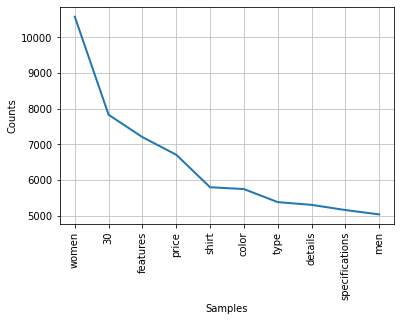

[('women', 10574), ('30', 7826), ('features', 7199), ('price', 6705), ('shirt', 5794), ('color', 5743), ('type', 5377), ('details', 5300), ('specifications', 5155), ('men', 5032), ('material', 4974), ('casual', 4972), ('fabric', 4958), ('general', 4772), ('collection', 4623), ('cm', 4537), ('set', 4473), ('box', 4428), ('cotton', 4313), ('pack', 4132), ('solid', 3961), ('number', 3767), ('neck', 3652), ('ideal', 3614), ('quality', 3608), ('gold', 3605), ('package', 3575), ('huge', 3522), ('necklace', 3458), ('brand', 3435), ('clothes', 3421), ('apparels', 3413), ('branded', 3374), ('printed', 3323), ('sales', 3276), ('design', 3249), ('style', 3134), ('black', 3073), ('fit', 3028), ('sleeve', 3021), ('bra', 3019), ('best', 2911), ('model', 2868), ('weight', 2811), ('made', 2794), ('alloy', 2765), ('top', 2716), ('cover', 2691), ('warranty', 2657), ('diamond', 2653), ('white', 2600), ('full', 2583), ('car', 2535), ('size', 2482), ('na', 2448), ('round', 2368), ('look', 2363), ('blue', 2

In [ ]:
# Top frequent words after removing domain related stop words

freq_word = Sengine_df['description'].str.cat(sep=' ')


words = nltk.tokenize.word_tokenize(freq_word)

word_dist = nltk.FreqDist(words)

word_dist.plot(10,cumulative = False)



print(word_dist.most_common())

The data shows, it has words like women, price, and shirt appeared commonly, because there are a lot of fashion-related items.

# Content-based Recommendation System and (Advanced) Product search engine

We will be using the Term Frequency and Inverse Document Frequency approach.

We will build 2 models:
- A content-based recommendation system
- A product search engine

TF-IDF and word embeddings can be used with both models. From the implementation point of view, both models are almost the same. But the problem each solves is different.

In [ ]:
# text cleaning

# Sengine_df['description'] = Sengine_df['description'].fillna('')

In [ ]:
#define the vectorizer, because it convert text into numerical representations

T_vec =  TfidfVectorizer(stop_words='english')

In [ ]:
# get the vectors

T_vec_matrix = T_vec.fit_transform(Sengine_df['description'])

#shape/size
T_vec_matrix.shape
(19998, 26162)



(19998, 26162)

There are 26,000 different words in the description.


calculating similarity scores for each combination and generate matrix.

In [ ]:
# Reversing the map of indices and product

product_index = pd.Series(Sengine_df.index,

                          index = Sengine_df['product_name']).drop_duplicates()

pd.DataFrame(product_index).reset_index().head()

,product_name,0
0,Alisha Solid Women's Cycling Shorts,0
1,FabHomeDecor Fabric Double Sofa Bed,1
2,AW Bellies,2
3,Alisha Solid Women's Cycling Shorts,3
4,Sicons All Purpose Arnica Dog Shampoo,4


The following functions will:

- Obtain the index given the product.
- Obtain cosine similarity scores.
- Sort the scores.
- Get the top N results from the list.
- Output the product names.

In [ ]:
# think of this line as,
# 'hey robot, I want you to do something, listen up!'

def predict_products(text):

    # getting index
    # This line helps the robot find the thing you like

    index = product_index[text]


    # This line helps the program find other things that are
    # similar to the thing you like. It's like asking the robot
    # to look through all the pages of the book and find the
    # pages that are similar to the one you like.
    # Obtaining the pairwsie similarity scores

    score_matrix = linear_kernel(T_vec_matrix[index],
                                 T_vec_matrix)

    # This line makes a list of all the things
    # that are similar to the thing you like.

    matching_sc = list(enumerate(score_matrix[0]))


    # Sort the product based on the similarity scores
    # This line sorts the list of similar things by
    # how similar they are. It's like putting the pages
    # in order from most similar to least similar

    matching_sc = sorted(matching_sc, key=lambda x: x[1], reverse=True)

    # Getting the scores of the 10 most similar product
    # This line takes the top 10 most similar things from
    # the list. It's like picking out the top 10 pages that
    # are most similar to the one you like.

    matching_sc = matching_sc[1:10]

    # Getting the product indices
    # This line shows you the names
    # of the top 10 most similar things.

    product_indices = [i[0] for i in matching_sc]

     # Show the similar products
    return Sengine_df['product_name'].iloc[product_indices]


# The robot is going to ask you what your favorite thing is
recommended_product = predict_products(input("Enter a product name: "))

# This line is like a rule for the robot to follow. It's saying,
# "if the robot found some things you might like, then do the following things:

if recommended_product is not None:

    # print out a message on the screen that says "Similar products",
    # so you know what the list is about. Then, it will print a blank
    # line to make the list easier to read.
    print ("Similar products")

    print("\n")


    # This line is telling the robot to go through each thing on the
    # list of recommended_product, one by one, and print each thing out
    # on a separate line. It's like the robot is reading the list to you out loud

    for product_name in recommended_product:

        print (product_name)

Enter a product name: AW Bellies
Similar products


Shopnetix Stylish & Comfort Men's Lace up Mocassins (SNX-4449) Casuals
Lee Parke Running Shoes
femitaly Women Bellies
Bootwale Bellies
Bootwale Bellies
Bootwale Bellies
Bootwale Bellies
Bootwale Bellies
Bootwale Bellies


#Product Search Engine Implementation

with Word embedding, which are N-dimensional vectors for each word that captures the meaning of the word along with context.

Let’s use the pretrained word2vec model on the news data set by Google. The trained model can be imported, and vectors can be obtained for each word. Then, any of the similarity measures can be leveraged to rank the results.


In [ ]:
# Creating list containing description of each product as sublist

fin = []

for i in range(len(Sengine_df['description'])):

    temp = []

    temp.append(Sengine_df['description'][i])

    fin = fin + temp

data1 = Sengine_df[['product_name','description']]

In [ ]:
#import the pretrained word2vec model

from gensim.models import KeyedVectors


filename = '/content/drive/MyDrive/GoogleNews-vectors-negative300.bin.gz'



model = KeyedVectors.load_word2vec_format(filename,
                                          binary = True,
                                          limit = 50000)



In [ ]:
# convert model into a pandas DataFrame
#df = pd.DataFrame(model.vectors,
                  #index = model.index2word)

# view the top 5 rows of the DataFrame
#print(df.head())


In [ ]:
# Preprocessing

from nltk.corpus import stopwords

stop = set(stopwords.words('english'))



def remove_stopwords(text, is_lower_case = False):

    pattern = r'[^a-zA-z0-9\s]' # removing special characters

    text = re.sub(pattern, '', text[0])

    tokens = nltk.word_tokenize(text) # Tokenizations

    tokens = [token.strip() for token in tokens] # removing more whitespace

    if is_lower_case: # lower case

        filtered_tokens = [token for token in tokens if token not in stop]

    else:

        filtered_tokens = [token
                           for
                           token
                           in tokens
                           if token.lower()
                           not in stop]

    filtered_text = ' '.join(filtered_tokens) # Join it all together.

    return filtered_text


In [ ]:
# Obtain the embeddings, lets use “300”
# if the robot knows what the word is,
# it will give a special number if not,
# it will assign zero to it.

def get_embedding(word):

    if word in model.wv.vocab:

        return model[word]

    else:

        return np.zeros(300)

In [ ]:
# Obtaining the average vector for all the documents

out_dict =  {}

for sen in fin:

    if sen.strip():  # Check if string is not empty or whitespace only

        average_vector = np.mean(np.array([get_embedding(k) for k in nltk.word_tokenize(remove_stopwords(sen))]), axis=0)

        dict = {sen: average_vector}

        out_dict.update(dict)



In [ ]:
# Get the similarity between the query and documents

def get_sim(query_embedding, average_vector_doc):

    sim = [(1 - scipy.spatial.distance.cosine(query_embedding, average_vector_doc))]

    return sim

In [ ]:
#out_dict =  {}

#for sen in fin:

    #if sen.strip():  # Check if string is not empty or whitespace only

        #average_vector = np.mean(np.array([get_embedding(k) for k in nltk.word_tokenize(remove_stopwords(sen))]), axis=0)

        #dict = {sen: average_vector}

        #out_dict.update(dict)





def Ranked_documents(query):

    query = remove_stopwords(query) # cleaning search query by removing stopwords or words that are not important

    query_tokens = nltk.word_tokenize(query) #convert seach query into token

    query_vector = np.mean(np.array([get_embedding(k) for k in query_tokens]), axis = 0) # combines all the vectors for the search query into one big vector.
                                                                                         # This big vector is like a code for the whole search query.

    query_vector = query_vector.reshape(1, -1).ravel()   # convert each query to a vector
                                                         # think of a vector as a special code that represent each word.

    sim_dict = {}  # Creating a blank dict to store values


    for key in out_dict:

        doc_vector = out_dict[key] # we're going to turn each of the things we're looking at into a code

        doc_vector = doc_vector.reshape(1, -1).ravel() # Reshape doc_vector to be 1-D

        sim_dict[key] = get_sim(query_vector, doc_vector) # compares the big vector for the search query to the vectors for each document.
                                                          # The code figures out how similar each document is to the search query based on
                                                          # how similar their vectors are

    sorted_dict = sorted(sim_dict.items(), key=lambda x: x[1], reverse=True) # puts all the documents in order from most similar to least similar to the search query,
                                                                             # and it gives that list of documents back to whoever asked for it.

    return sorted_dict # Returning the sorted list


In [ ]:
# Call the IR function with a query
query = input("What would you like to search")
Ranked_documents(query)
# output

What would you like to searchAW Bellies


[('features alisha solid women cycling shorts cotton lycra navy red navy specifications alisha solid women cycling shorts shorts details number contents sales package pack fabric cotton lycra type cycling shorts general details pattern solid ideal women fabric care gentle machine wash lukewarm water bleach additional details style code altht_3p_21 box shorts',
  [1]),
 ('fabhomedecor fabric double sofa bed finish color leatherette black mechanism type pull price 22 646 fine deep seating experience save space new click clack sofa bed easy fold vice versa simple click clack mechanism chrome legs mango wood frame long term durability double cushioned sofa bed provide extra softness make fine seating experience double bed easily sleep two specifications fabhomedecor fabric double sofa bed finish color leatherette black mechanism type pull installation demo installation demo details installation demo done cost part purchase service partner visit location within 72 business hours box sofa be

# Advanced Search Engine Using PyTerrier and Sentence-BERT

In [ ]:
!pip install --upgrade git+https://github.com/terrier-org/pyterrier.git
!pip install --upgrade --force-reinstall nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/terrier-org/pyterrier.git to /tmp/pip-req-build-fqpvnlwa
  Running command git clone --filter=blob:none --quiet https://github.com/terrier-org/pyterrier.git /tmp/pip-req-build-fqpvnlwa
  Resolved https://github.com/terrier-org/pyterrier.git to commit dc7997ed4bb4bbaf78f639a511bfe92fcd290c02
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 33.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.6/69.6 KB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.5/311.5 KB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 KB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━

In [ ]:
! pip install ipython
! pip install jedi>=0.10
! python -m pip install extras_require


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 37.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 525.1/525.1 KB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.0/127.0 KB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.9/107.9 KB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 62.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 59.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 81.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 70.2 MB/s eta 0:00:00
     ━

In [ ]:
# Importing necessary library and modules

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import string
import re

%matplotlib inline
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer

lem = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
exclude = set(string.punctuation)
import string

!pip install python-terrier
import pyterrier as pt
import pyterrier as pt
pt.init()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
terrier-assemblies 5.7 jar-with-dependencies not found, downloading to /root/.pyterrier...
Done
terrier-python-helper 0.0.7 jar not found, downloading to /root/.pyterrier...
Done


PyTerrier 0.9.2 has loaded Terrier 5.7 (built by craigm on 2022-11-10 18:30) and terrier-helper 0.0.7



In [ ]:
!pip install -q transformers
!pip install -q torch
!pip install sentencepiece
!git clone https://github.com/neuspell/neuspell
!pip install -U sentence-transformers
!pip install neuspell
!pip install -e neuspell/






     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 76.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 78.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.3 MB/s eta 0:00:00
Cloning into 'neuspell'...
remote: Enumerating objects: 689, done.
remote: Counting objects: 100% (176/176), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 689 (delta 137), reused 112 (delta 112), pack-reused 513
Receiving objects: 100% (689/689), 74.38 MiB | 18.05 MiB/s, done.
Resolving deltas: 100% (366/366), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for se

In [ ]:
import os
os.chdir("/content/neuspell")
#!pip install -r /content/neuspell/extras-requirements.txt
!python -m spacy download en_core_web_sm

#Unzipping the multi-linguistic packages
!wget https://storage.googleapis.com/bert_models/2018_11_23/multi_cased_L-12_H-768_A-12.zip
!unzip *.zip

#importing neuspell
from neuspell import BertChecker
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('sentence-transformers/bert-base-nli-mean-tokens')

2023-03-11 21:22:07.143889: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-11 21:22:08.023878: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-11 21:22:08.023972: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-11 21:22:08.023989: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT War

In [ ]:
import pandas as pd


# loading the datset from the drive
path = '/content/drive/MyDrive/DAtasets/flipkart_com-ecommerce_sample.csv'

Search_engine_df = pd.read_csv(path)


Search_engine_df.head()



,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,7f7036a6d550aaa89d34c77bd39a5e48,2016-03-25 22:59:23 +0000,http://www.flipkart.com/fabhomedecor-fabric-do...,FabHomeDecor Fabric Double Sofa Bed,"[""Furniture >> Living Room Furniture >> Sofa B...",SBEEH3QGU7MFYJFY,32157.0,22646.0,"[""http://img6a.flixcart.com/image/sofa-bed/j/f...",False,FabHomeDecor Fabric Double Sofa Bed (Finish Co...,No rating available,No rating available,FabHomeDecor,"{""product_specification""=>[{""key""=>""Installati..."
2,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,"[""Footwear >> Women's Footwear >> Ballerinas >...",SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
3,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,"[""Clothing >> Women's Clothing >> Lingerie, Sl...",SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,2016-03-25 22:59:23 +0000,http://www.flipkart.com/sicons-all-purpose-arn...,Sicons All Purpose Arnica Dog Shampoo,"[""Pet Supplies >> Grooming >> Skin & Coat Care...",PSOEH3ZYDMSYARJ5,220.0,210.0,"[""http://img5a.flixcart.com/image/pet-shampoo/...",False,Specifications of Sicons All Purpose Arnica Do...,No rating available,No rating available,Sicons,"{""product_specification""=>[{""key""=>""Pet Type"",..."


In [ ]:
Search_engine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20002 entries, 0 to 20001
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   uniq_id                20000 non-null  object
 1   product_name           20000 non-null  object
 2   product_category_tree  20002 non-null  object
 3   pid                    20000 non-null  object
 4   description            19998 non-null  object
 5   brand                  14136 non-null  object
dtypes: object(6)
memory usage: 937.7+ KB


In [ ]:
# examining product category tree

Search_engine_df['product_category_tree']

0        [Clothing ,  Women's Clothing ,  Lingerie, Sle...
1        [Furniture ,  Living Room Furniture ,  Sofa Be...
2        [Footwear ,  Women's Footwear ,  Ballerinas , ...
3        [Clothing ,  Women's Clothing ,  Lingerie, Sle...
4        [Pet Supplies ,  Grooming ,  Skin & Coat Care ...
                               ...                        
19997    [Baby Care ,  Baby & Kids Gifts ,  Stickers , ...
19998    [Baby Care ,  Baby & Kids Gifts ,  Stickers , ...
19999    [Baby Care ,  Baby & Kids Gifts ,  Stickers , ...
20000                                                [nan]
20001                                                [nan]
Name: product_category_tree, Length: 20002, dtype: object

Text Processing

In [ ]:
# lets make the 'category_tree' column more simple to read by removing square brackets, quotation marks and so on.


Search_engine_df['product_category_tree'] = Search_engine_df['product_category_tree'].map(lambda x:str(x).strip('[]')) # Removing square brackets


Search_engine_df['product_category_tree'] = Search_engine_df['product_category_tree'].map(lambda x:x.strip('"')) # Removing quotation marks


Search_engine_df['product_category_tree'] = Search_engine_df['product_category_tree'].map(lambda x:x.split('>>')) # Separating/split the text.

In [ ]:
Search_engine_df.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [ ]:
# Dropping unwanted columns

Search_engine_df.drop(["crawl_timestamp",
         "product_url",
         "image",
         "retail_price",
         "discounted_price",
         "is_FK_Advantage_product",
         "product_rating",
         "overall_rating",
         "product_specifications"],

        axis = 1,
        inplace = True)


In [ ]:
# Dropping duplicate products

uniq_prod = Search_engine_df.copy()

uniq_prod.drop_duplicates(subset ="product_name",
                          keep = "first",
                          inplace = True)

In [ ]:
# Function to remove stop words, punctuations
# perform tokenization and lemmatization

def filter_keywords(doc):

    doc = doc.lower()

    stop_free = " ".join([i for i in doc.split() if i not in stop_words])

    punc_free = "".join(ch for ch in stop_free if ch not in exclude)

    word_tokens = word_tokenize(punc_free)

    filtered_sentence = [(lem.lemmatize(w, "v")) for w in word_tokens]

    return filtered_sentence

In [ ]:
import nltk
nltk.download('omw-1.4')


uniq_prod['product'] = uniq_prod['product_name'].astype(str).apply(filter_keywords)

uniq_prod['description'] = uniq_prod['description'].astype(str).apply(filter_keywords)


uniq_prod['brand'] = uniq_prod['brand'].astype("str").apply(filter_keywords)

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
# Combine all the keywords for each product

uniq_prod["keywords"] = uniq_prod['product'] + uniq_prod['brand'] + Search_engine_df['product_category_tree']+uniq_prod['description']

uniq_prod["keywords"] = uniq_prod["keywords"].apply(lambda x: ' '.join(x))

In [ ]:
# Creating a 'docno' column, which gives recommendations

uniq_prod['docno'] = uniq_prod['product_name']

uniq_prod["keywords"] = uniq_prod["keywords"].astype(str)


#uniq_prod["keywords"] = uniq_prod["keywords"].apply(lambda x: str(x) if isinstance(x, str) else None).dropna()




In [ ]:
# Drop unwanted columns

uniq_prod.drop(['product',
                'brand',
                'pid',
                'product_name'],

               axis = 1,
              inplace = True)

uniq_prod.head()

,uniq_id,product_category_tree,description,keywords,docno
0,c2d766ca982eca8304150849735ffef9,"[Clothing , Women's Clothing , Lingerie, Sle...","[key, feature, alisha, solid, womens, cycle, s...",alisha solid womens cycle short alisha Clothin...,Alisha Solid Women's Cycling Shorts
1,7f7036a6d550aaa89d34c77bd39a5e48,"[Furniture , Living Room Furniture , Sofa Be...","[fabhomedecor, fabric, double, sofa, bed, fini...",fabhomedecor fabric double sofa bed fabhomedec...,FabHomeDecor Fabric Double Sofa Bed
2,f449ec65dcbc041b6ae5e6a32717d01b,"[Footwear , Women's Footwear , Ballerinas , ...","[key, feature, aw, belly, sandals, wedge, heel...",aw belly aw Footwear Women's Footwear Ball...,AW Bellies
4,bc940ea42ee6bef5ac7cea3fb5cfbee7,"[Pet Supplies , Grooming , Skin & Coat Care ...","[specifications, sicons, purpose, arnica, dog,...",sicons purpose arnica dog shampoo sicons Pet S...,Sicons All Purpose Arnica Dog Shampoo
5,c2a17313954882c1dba461863e98adf2,[Eternal Gandhi Super Series Crystal Paper Wei...,"[key, feature, eternal, gandhi, super, series,...",eternal gandhi super series crystal paper weig...,Eternal Gandhi Super Series Crystal Paper Weig...


# Building the advanced Search Engine using BERT

To generate an index for the keywords in a given dataset, use the DFIndexer object. This index functions as a sort of lookup database by translating each keyword into a distinct numeric ID. This index's goal is to make it quick and easy to find documents that include a particular keyword.

Without an index, finding documents that contain a certain keyword would necessitate a linear scan of the entire dataset, which might be extremely time-consuming for big datasets. When an index is present, however, the search can be carried out considerably more quickly by looking up the keyword's ID in the index and then getting the documents connected to that ID.

It is simple to establish this index because the DFIndexer object takes care of the text data tokenization, vocabulary creation, and integer ID assignment processes. Additionally, it offers ways to locate keywords and retrieve documents that include them.

In [ ]:
uniq_prod["keywords"] = uniq_prod["keywords"].apply(lambda x: len(str(x)))
uniq_prod['docno'].fillna(value='unknown', inplace=True)

In [ ]:
 # use the DFIndexer object to create the index for keyword

!rm -rf /content/iter_index_porter

pd_indexer = pt.DFIndexer("/content/pd_index")#, overwrite= True)


indexref = pd_indexer.index(uniq_prod["keywords"],
                            uniq_prod["docno"])

06:14:16.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 508
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:16.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 405
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:16.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1061
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:16.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:16.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:17.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 370
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:17.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:17.533 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 607
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:17.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 816
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:17.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:17.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 305
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:18.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 222
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:18.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 185
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:18.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:18.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:18.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 257
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:19.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:19.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.265 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 409
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:19.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:19.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 394
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:19.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:19.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 395
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:20.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 734
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:20.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 540
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:20.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.549 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 764
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:20.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:20.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:20.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:21.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 355
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:21.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 408
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:21.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 737
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:21.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 495
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:21.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:21.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 378
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:22.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 286
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:22.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 556
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:22.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.772 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 364
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:22.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:22.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 279
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:23.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 502
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:23.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.267 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 316
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:23.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:23.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 306
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:23.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:23.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:24.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 269
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:24.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.346 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 498
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:24.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 325
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:24.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:24.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 680
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:25.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 213
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:25.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:25.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:25.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:25.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 249
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:26.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 329
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:26.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 348
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

.indexing.Indexer - skipping null document
06:14:26.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.575 [main] WARN org.terrier.structure

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 331
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

s.indexing.Indexer - skipping null document
06:14:26.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:26.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 366
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:27.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 347
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:27.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1924
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:27.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 854
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:27.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1033
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:27.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:27.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 577
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

s.indexing.Indexer - skipping null document
06:14:28.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.356 [main] WARN org.terrier.structures.indexing

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 991
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

s.indexing.Indexer - skipping null document
06:14:28.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.549 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.676 [main] WARN org.terrier.structures.indexing

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 996
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

es.indexing.Indexer - skipping null document
06:14:28.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:28.999 [main] WARN org.terrier.structures.indexin

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 655
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

res.indexing.Indexer - skipping null document
06:14:29.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.323 [main] WARN org.terrier.structures.indexi

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 538
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:29.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.503 [main] WARN org.terrier.struc

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 331
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

tures.indexing.Indexer - skipping null document
06:14:29.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.774 [main] WARN org.terrier.structures.inde

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1006
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

ctures.indexing.Indexer - skipping null document
06:14:29.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:29.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.105 [main] WARN org.terrier.structures.ind

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 408
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:30.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 590
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:30.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.394 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.439 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2322
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

ructures.indexing.Indexer - skipping null document
06:14:30.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1067
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:30.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:30.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 930
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:31.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 759
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:31.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 829
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

.structures.indexing.Indexer - skipping null document
06:14:31.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 673
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:31.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:31.822 [main] WARN org.terri

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 639
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

er.structures.indexing.Indexer - skipping null document
06:14:32.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 699
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:32.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 440
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ier.structures.indexing.Indexer - skipping null document
06:14:32.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.778 [main] WARN org.terrier.struct

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 471
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:32.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:32.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 424
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

rrier.structures.indexing.Indexer - skipping null document
06:14:33.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.251 [main] WARN org.t

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 412
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

errier.structures.indexing.Indexer - skipping null document
06:14:33.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.440 [main] WARN org

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 461
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

.terrier.structures.indexing.Indexer - skipping null document
06:14:33.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.789 [main] WARN org.terrier.s

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 539
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:33.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:33.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 595
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:14:34.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 694
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.524 [main] WARN org.terrie

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1012
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:34.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1196
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:34.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.791 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.889 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:34.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 481
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:14:34.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.115 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 989
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:35.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 570
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:35.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 765
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 435
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:35.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:35.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1322
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:36.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1176
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:36.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 652
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:36.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:36.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 465
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:36.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 461
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:37.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 727
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:37.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 796
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:37.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:37.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 223
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:38.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:38.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 331
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:38.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 230
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:38.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.8

  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 372
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:14:38.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:38.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 453
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.371 [main]

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 304
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:39.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:39.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:39.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:39.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 181
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:40.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 305
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:40.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 223
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:40.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 233
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:40.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 732
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:40.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:40.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:41.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 772
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:41.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 397
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:41.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.665 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:41.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.772 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 303
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:41.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:41.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:42.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:42.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.5

  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 247
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:14:42.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 267
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:42.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 774
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:42.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:42.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 679
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:43.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 396
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:43.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:43.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:43.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:43.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:44.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:44.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:44.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.481 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.588 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 293
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:44.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 354
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:44.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:44.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1443
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:45.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 275
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:45.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.394 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 631
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:45.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 282
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:45.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 465
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:45.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:45.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 295
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:46.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2145
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:46.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 426
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:46.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.592 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:46.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 539
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:46.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:46.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 207
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:47.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.267 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 509
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:47.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 207
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:47.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.772 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 414
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:47.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:47.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:48.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 292
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:48.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 483
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:48.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:48.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 346
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:48.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:48.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 314
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:49.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 322
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:49.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 605
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:49.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.702 [mai

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 609
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

n] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 355
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:49.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:49.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 344
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:50.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 688
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:50.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 945
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:50.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 326
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:50.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 311
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:50.958 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:50.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 490
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:51.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 443
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:51.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 573
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:51.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 536
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:51.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:51.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 651
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:52.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 688
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:52.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 457
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:52.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 824
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:52.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.791 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 932
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:52.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:52.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 277
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:53.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 809
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:53.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.335 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1509
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:53.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 420
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:53.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 251
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:53.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:53.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:54.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.267 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 270
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:54.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:54.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 694
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:54.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 252
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:54.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:54.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 481
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:55.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 251
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:55.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 433
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:55.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 296
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:55.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:55.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 617
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:56.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 653
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:56.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 617
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:56.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 246
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:56.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 284
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:56.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:56.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 618
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:57.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 617
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:57.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 617
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:57.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 617
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:57.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 287
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:57.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:57.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1029
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:14:58.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 263
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:58.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.513 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 647
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:58.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 335
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:58.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 618
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:58.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:58.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 991
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:59.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 299
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:59.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 667
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:59.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 657
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:14:59.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.840 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:14:59.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:00.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1433
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:00.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:00.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 512
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:00.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.8

  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 286
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent

06:15:00.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:00.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:01.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 339
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:01.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:01.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.592 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 254
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:01.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:01.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 308
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:01.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:02.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:02.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:02.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 351
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:02.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.903 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 312
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:02.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:02.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:03.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:03.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:03.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:03.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:03.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 297
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:04.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 325
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:04.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 339
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:04.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 762
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:04.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:04.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:04.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 309
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:05.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 650
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:05.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid pyt

06:15:05.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.654 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 238
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:05.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 204
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:05.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:05.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 205
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:06.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:06.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 653
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:06.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:06.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.897 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:06.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid pyt

06:15:07.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 328
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:07.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.394 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:07.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:15:07.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 257
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:07.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:07.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 303
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:08.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.221 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 226
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:08.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:08.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.665 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 212
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:08.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:08.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:08.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 388
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:09.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:09.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 504
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:09.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 298
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:09.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.897 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:09.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:09.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 347
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:10.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:10.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.6

  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 345
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid pyt

06:15:10.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 313
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:10.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:10.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 572
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:11.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:11.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:11.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:11.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:11.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:11.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 351
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:12.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 269
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:12.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 208
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:12.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:12.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:12.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:12.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 223
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ipping null document
06:15:13.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping nul

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 225
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:13.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.481 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 266
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:13.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 210
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:13.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:13.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 526
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

 org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.199 [main] WARN org.terri

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:14.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 236
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:14.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:14.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:14.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:14.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1276
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:15.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:15.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.346 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.394 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:15.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 241
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:15.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:15.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:15.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 276
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:16.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 310
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:16.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:16.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.588 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 332
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:16.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 311
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:16.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:16.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 377
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:17.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 377
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:17.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 350
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:17.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:17.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.897 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:17.9

  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 341
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jn

g null document
06:15:18.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 227
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:18.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 311
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:18.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.605 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:18.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:18.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 370
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:19.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 256
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ipping null document
06:15:19.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping nul

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 284
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:19.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 244
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

skipping null document
06:15:19.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:19.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping n

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 476
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

 skipping null document
06:15:20.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.271 [main] WARN org.terrier.structures.indexing.Indexer 

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 332
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

- skipping null document
06:15:20.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.563 [main] WARN org.terrier.structures.indexing.Indexe

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 293
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

r - skipping null document
06:15:20.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:20.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 263
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:21.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:21.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1440
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:21.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 310
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:21.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 360
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

er - skipping null document
06:15:21.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:21.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.156 [main] WARN org.terrier.structures.indexing.Indexer - skipp

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:22.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:22.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:22.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:22.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:22.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 479
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:23.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 369
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:23.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 555
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:23.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 449
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:23.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:23.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 353
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:23.996 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 392
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid pyt

06:15:24.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 316
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:24.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 391
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:24.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.654 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1114
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:24.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:24.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1062
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:25.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 963
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:25.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 668
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:25.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 428
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:25.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 357
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:25.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:25.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1405
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:26.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 233
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:26.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:26.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:26.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 212
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:26.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:26.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 406
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:27.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 220
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:27.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:27.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 381
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:27.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:27.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 247
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:27.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 228
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:28.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:28.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 240
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:28.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:28.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:28.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 180
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:29.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.221 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:29.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 269
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:29.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.567 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:29.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:29.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:29.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 332
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:30.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 261
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:30.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 291
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:30.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 276
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:30.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.753 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:30.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:30.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 275
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:31.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 274
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:31.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 274
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:31.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 230
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ndexer - skipping null document
06:15:31.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:31.964 [main] WARN org.terrier.structures.indexing.Indexer - s

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:31.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:32.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 231
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:32.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:32.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 189
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:32.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:32.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.0

  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 350
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertF

06:15:33.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:33.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 306
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:33.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:33.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 291
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:33.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.958 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:33.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 248
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:34.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 235
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:34.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:34.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 255
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

es.indexing.Indexer - skipping null document
06:15:34.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.884 [main] WARN org.terrier.structures.indexin

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 220
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:34.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:34.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:35.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:35.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 279
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:35.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.605 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 184
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:35.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:35.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 218
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:35.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 317
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:36.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 353
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:36.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 192
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:36.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:36.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:36.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:37.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.115 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.151 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 229
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:37.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:37.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 344
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:37.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.753 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:37.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:37.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 218
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:38.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 228
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:15:38.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 296
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:38.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 251
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:38.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:38.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:38.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:39.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.335 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 197
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:39.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 320
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:39.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 275
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:39.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:39.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 238
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:39.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 306
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:40.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 230
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:40.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:40.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 243
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:40.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.840 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:40.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 222
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:41.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

 skipping null document
06:15:41.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:41.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 200
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:41.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 312
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:41.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:41.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 296
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:42.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 194
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:42.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 341
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:42.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:42.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 312
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:42.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:42.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:43.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 204
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:43.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 180
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conve

06:15:43.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 518
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:43.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:43.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 246
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:44.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 295
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:44.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 245
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:44.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 236
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:44.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 276
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:44.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:44.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 221
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertF

06:15:45.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 277
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:45.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:45.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.513 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:45.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.753 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 257
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:45.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:45.985 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 225
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:46.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 348
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:46.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 270
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:46.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 235
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:46.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 924
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:46.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:46.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:47.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:47.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 196
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:47.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 236
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:47.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:47.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:47.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 401
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:48.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 247
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:48.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.533 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 252
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:48.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.654 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 297
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:48.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:48.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 351
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:49.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 950
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:49.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 597
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:49.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.513 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 497
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

in] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.865 [main] WARN o

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 448
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:49.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:49.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 465
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:50.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1535
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:50.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.4

  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2030
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2012
Traceback (most rece

06:15:50.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.533 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2021
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:50.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1133
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:50.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:50.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1646
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:51.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 387
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:51.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 477
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:51.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1395
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:51.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:51.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1430
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:52.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 554
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:52.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1629
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:52.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1177
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:52.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1783
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:52.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:52.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1235
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:53.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 430
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:53.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1201
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:53.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 699
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:53.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 909
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:53.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:53.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1219
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:54.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 367
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:54.346 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 907
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:54.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 722
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:54.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:54.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 261
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:54.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.061 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:55.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1003
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:55.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1214
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:55.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 338
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:55.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:55.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 486
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:56.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 602
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:56.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1172
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:56.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1127
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:56.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.840 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 543
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:56.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:56.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 621
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:57.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1371
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:57.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 400
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:57.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1611
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:57.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 887
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:57.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:57.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1079
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:58.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 774
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:58.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1107
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:58.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.665 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1164
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convert

06:15:58.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.958 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:58.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1169
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:15:58.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 900
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:59.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 801
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:59.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 646
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:15:59.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 426
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:15:59.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:15:59.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 338
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:00.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 578
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:00.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 234
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:00.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 176
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:00.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:00.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:00.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:01.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:01.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 193
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:01.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:01.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:01.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:01.996 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 193
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:02.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.267 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:02.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.439 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 629
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:02.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 340
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:02.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:02.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 244
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:03.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.130 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 240
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:03.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 310
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:03.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:03.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 245
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:03.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:03.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 364
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:04.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 215
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:04.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1135
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:04.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1193
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:04.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 270
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:04.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:04.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 279
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:05.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 279
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:05.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 625
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:05.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2227
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:05.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 362
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:05.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:05.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 348
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:06.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 385
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:06.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.439 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 586
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:06.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 331
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:06.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:06.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 245
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:07.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.1

  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 348
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:16:07.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.309 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:07.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.549 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 314
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:07.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:07.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:07.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 375
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:08.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 183
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:08.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:08.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 210
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:08.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 388
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:08.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.903 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:08.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 189
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:09.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 381
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:09.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 387
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:09.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.549 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 337
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:09.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 264
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:09.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:09.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:10.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 350
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:10.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 352
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

16:10.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 394
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:10.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 197
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:10.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:10.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 763
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:11.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 447
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:11.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 442
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:11.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 740
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:11.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:11.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1232
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:12.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 970
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:12.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 525
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:12.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 386
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:12.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 417
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:12.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:12.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 534
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:13.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1135
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:13.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 781
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:13.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 396
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:13.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 730
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:13.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:13.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.080 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1339
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:14.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 381
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:14.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 444
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:14.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1335
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:14.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:14.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1021
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:14.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 453
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:15.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1421
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:15.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:15.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 395
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:15.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:15.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 675
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:16.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:16.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 191
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:16.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 335
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:16.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 430
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:16.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:16.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 473
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:17.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 371
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:17.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.335 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1493
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:17.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 483
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:17.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:17.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:17.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 343
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:18.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:18.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 236
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:18.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 304
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:18.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:18.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 612
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:18.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 234
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:19.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:19.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1583
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-p

06:16:19.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 514
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/ind

06:16:19.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:19.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1147
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:20.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 371
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:20.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 376
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:20.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 596
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:20.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1666
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:20.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:20.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 604
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:21.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 943
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:21.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.335 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 432
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:21.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 355
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:21.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 224
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:21.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:21.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 560
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:22.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:22.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 659
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:22.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 697
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:22.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 248
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:22.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:22.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 233
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:23.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.221 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:23.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1050
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:23.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1083
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:23.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:23.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1061
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:24.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1103
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:24.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.4

  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 485
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:16:24.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1470
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:24.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 686
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:24.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:24.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 845
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:25.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 536
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:25.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 893
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:25.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 595
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:25.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 407
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:25.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:25.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 629
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:26.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 759
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:26.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 412
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:26.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 551
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:26.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:26.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 496
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:26.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 532
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:27.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.265 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 885
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:27.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 499
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:27.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 611
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:27.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:27.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 919
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:28.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1363
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:28.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 557
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:28.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 295
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:28.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 784
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:28.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:28.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:29.092 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 636
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:29.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 390
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:29.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 394
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:29.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:29.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:29.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1409
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:30.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 431
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:30.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.543 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 318
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:30.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 705
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:30.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:30.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1031
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:30.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 459
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:31.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 210
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:31.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 882
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:31.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 448
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:31.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:31.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 701
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:31.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 240
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:32.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:32.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.513 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 867
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:32.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 414
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:32.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:32.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 535
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:33.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:33.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 242
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:33.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.592 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 234
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:33.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 230
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:33.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:33.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.061 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:34.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.115 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 773
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:34.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 257
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:34.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:34.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 363
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:34.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:34.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.035 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:35.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 303
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:35.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 274
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:35.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 414
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:35.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 414
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:35.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:35.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 241
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:36.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.221 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:36.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1030
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:36.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1397
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:36.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:36.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 397
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:37.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1405
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:37.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.265 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 221
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:37.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 467
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:37.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:37.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:37.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:38.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 176
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

s.indexing.Indexer - skipping null document
06:16:38.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.474 [main] WARN org.terrier.structures.indexing

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 231
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:38.522 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.567 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 264
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:38.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.757 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 236
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:38.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:38.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 459
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:39.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1117
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:39.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 239
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:39.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.632 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 284
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:39.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:39.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 869
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:39.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.115 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.133 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.151 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 340
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:40.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:40.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:40.605 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 267
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:40.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.889 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:40.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:41.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 160
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:41.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1201
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:41.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 265
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:41.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 261
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:41.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.903 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:41.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 282
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:42.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 338
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:42.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 968
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:42.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1237
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:42.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 325
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:42.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:42.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:43.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 296
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:43.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:43.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 293
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:43.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:43.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 303
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:44.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 306
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:44.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 314
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:44.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:44.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.694 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:44.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.985 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:44.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:45.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 719
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:45.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:45.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.785 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:45.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:45.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 295
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:46.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 791
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:46.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 895
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:46.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:46.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1223
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

6:16:46.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:46.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 297
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:47.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 964
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:47.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.487 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 226
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:47.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:47.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:47.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:48.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.164 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:48.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 297
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:48.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.533 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.632 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 194
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:48.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:48.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 297
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:48.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 405
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:49.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.279 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.335 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 293
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:49.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 299
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:49.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 311
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:49.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.899 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:49.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:50.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:50.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 335
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:50.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 215
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:50.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 317
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:50.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:50.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 342
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:16:51.061 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.199 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1710
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:51.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 375
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:51.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.516 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.629 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 394
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:51.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 260
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:51.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:51.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 287
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:52.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 330
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:52.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.4

  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 229
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/ind

06:16:52.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 238
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:52.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 390
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:52.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:52.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 251
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:53.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1035
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:16:53.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.425 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 321
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:53.564 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 314
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:53.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:53.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 471
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:53.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.1

  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 471
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 274
Traceback (most recent

06:16:54.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 292
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:54.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 446
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:54.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 250
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:54.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:54.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 253
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:55.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:55.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:55.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 521
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:55.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 227
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:55.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:55.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.009 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 264
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:56.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 287
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:56.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:56.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 312
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

6.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.858 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.886 [mai

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 292
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:56.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:56.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:57.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.228 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 259
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:57.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 311
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertF

06:16:57.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 209
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:57.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 485
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:57.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:57.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 243
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:58.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 352
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:58.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:58.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 213
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:58.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:58.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 239
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

nt
06:16:59.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.055 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 256
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:59.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 244
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:59.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:59.659 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.825 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 254
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:16:59.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.916 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:16:59.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1224
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:00.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 334
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:00.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 689
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:00.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 464
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:00.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.833 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1595
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:00.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:00.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 415
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:01.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 644
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:01.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 910
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:01.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.736 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 721
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:01.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:01.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 243
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:02.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.149 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:02.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.247 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.266 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 250
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:02.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 233
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:02.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.796 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 264
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:02.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.971 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:02.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:03.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 241
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:03.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.291 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:03.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:03.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 286
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:03.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.969 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:03.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.007 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 584
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:04.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.265 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 360
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:04.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2011
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:04.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:04.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 586
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:04.959 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:04.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.111 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.147 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 313
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:05.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.265 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 175
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:05.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2965
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:05.601 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:05.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:05.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 244
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:06.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.047 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 245
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:06.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 284
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:06.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.637 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 312
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:06.654 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 279
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:06.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:06.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 343
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:07.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 399
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:07.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 371
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:07.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.626 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:07.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.766 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.837 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 214
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:07.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:07.985 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.014 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 365
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:08.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 371
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:08.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 399
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:08.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 336
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:08.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.848 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.854 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:08.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 363
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:08.997 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.095 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:09.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.330 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 292
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:09.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.422 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 313
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jn

06:17:09.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 385
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:09.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:09.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 261
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:10.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.156 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 299
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:10.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.368 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.603 [main] WARN

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 282
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:10.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 812
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:10.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:10.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:11.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1272
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:11.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 313
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:11.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.535 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1607
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:11.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.806 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 341
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:11.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:11.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:12.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.151 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.218 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 320
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:12.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.5

  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 332
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:17:12.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 202
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:12.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.753 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.810 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.843 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.897 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:12.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:12.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.050 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 382
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:13.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.223 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 304
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:13.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:13.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.672 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.748 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 267
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:13.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.958 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:13.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 467
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:14.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.153 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 258
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:14.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 302
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:14.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:14.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.795 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 235
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:14.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.980 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:14.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 398
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:15.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 487
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:15.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.312 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2448
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:15.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.592 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 357
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:15.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.746 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.889 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 379
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:15.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.978 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:15.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 541
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:16.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.305 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 340
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:16.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.469 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 352
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:16.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 205
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:16.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 240
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:16.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:16.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.033 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.144 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 237
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:17.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.272 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 255
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:17.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.499 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 185
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:17.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.729 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 269
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:17.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.819 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:17.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 212
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:18.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 221
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:18.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.236 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.408 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 325
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:18.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.566 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 252
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:18.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:18.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.896 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:18.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 275
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:19.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.123 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 208
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:19.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 227
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:19.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.649 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 477
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:19.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.765 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.783 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2763
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:19.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:19.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.002 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.019 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 216
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:20.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.282 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 208
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:20.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.513 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 326
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:20.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.628 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 216
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:20.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.855 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.929 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.948 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:20.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:20.985 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.159 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 293
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:21.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.237 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 724
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:21.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.602 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 227
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:21.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:21.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:21.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 217
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:22.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.185 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:22.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.332 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.373 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.394 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 207
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:22.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 210
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:22.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.741 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 210
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:22.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:22.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1030
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:23.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.126 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 738
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:23.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.463 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 3158
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:23.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.711 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 350
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:23.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.836 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.923 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 553
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:23.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:23.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.113 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.151 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 278
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:24.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 327
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:24.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.439 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.533 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 249
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:24.581 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 342
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:24.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.903 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.937 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:24.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 317
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:25.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.106 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.119 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.151 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 403
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:25.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 320
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:25.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.504 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.539 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.578 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1065
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:25.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 300
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:25.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:25.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 233
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:26.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.072 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.110 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.115 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.2

  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 571
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertF

06:17:26.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.331 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 889
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:26.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.526 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.611 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 188
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:26.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 191
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:26.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:26.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.044 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 245
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:27.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.208 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.256 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 231
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:27.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.359 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.434 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:27.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.549 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.606 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 231
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:27.721 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.753 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.767 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 286
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:27.942 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.979 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:27.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.105 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 249
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:28.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.170 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.206 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.226 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 242
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:28.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.448 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:28.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 422
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:28.779 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.877 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.909 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.941 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 694
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:28.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:28.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.029 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 899
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:29.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 906
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:29.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.439 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.531 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.547 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.567 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1909
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:29.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.743 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1065
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:29.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.832 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:29.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 732
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:30.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.063 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.172 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.188 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 374
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:30.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.283 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.389 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 268
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:30.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.569 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 610
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:30.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 315
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:30.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:30.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 276
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:31.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.182 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 255
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:31.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 234
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:31.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1502
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:31.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.794 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.829 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 222
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:31.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:31.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 530
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:32.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.173 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.192 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.211 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:32.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.391 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.398 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.442 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.456 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.474 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 238
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:32.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.625 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.655 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 226
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:32.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.804 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.821 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.906 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.9

jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 483
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 483
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJ

06:17:32.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:32.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.006 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.067 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.098 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 167
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:33.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.189 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.207 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.225 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.298 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 255
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:33.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.475 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.490 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 547
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:33.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.772 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 196
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:33.841 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:33.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 238
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:34.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.057 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.076 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.177 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 641
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:34.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.349 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 277
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:34.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 592
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:34.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.703 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.868 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1828
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:34.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.966 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:34.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.013 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.096 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 187
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:35.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.176 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 377
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:35.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.443 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.482 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.521 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 623
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:35.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.713 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 384
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:35.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.750 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.884 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 570
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:35.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:35.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 479
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:36.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.299 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 419
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:36.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.481 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1018
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:36.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.683 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 405
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:36.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.890 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 509
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:36.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:36.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.070 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.169 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 764
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:37.190 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 333
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:37.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.495 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.512 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.530 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.568 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.586 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1381
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:37.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.640 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.686 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 470
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:37.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.839 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.859 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.898 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.944 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.963 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:37.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 518
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:38.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.145 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 476
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:38.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 952
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:38.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.599 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.619 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.658 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 427
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:38.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.697 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.787 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.850 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 465
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

uctures.indexing.Indexer - skipping null document
06:17:38.903 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.922 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.961 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:38.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.000 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.041 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.061 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.077 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 536
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:39.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.155 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.174 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 586
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:39.313 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.361 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.382 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 890
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:39.541 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.707 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 356
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:39.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.772 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.873 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 979
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:39.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:39.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.012 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.073 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1262
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:40.157 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.204 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.262 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.286 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1572
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:40.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.399 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.419 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.567 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:40.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.612 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2100
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:40.803 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.862 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.955 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:40.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 385
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:41.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.134 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 532
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:41.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.242 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.245 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.325 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.378 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 818
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:41.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.524 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 628
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:41.644 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.702 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.738 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.771 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.814 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 195
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:41.875 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.887 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.902 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.936 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.952 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:41.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.042 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 265
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:42.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.231 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:42.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.292 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.381 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.395 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 301
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:42.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.515 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.562 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.590 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.623 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.641 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 283
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:42.692 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.708 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.755 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 212
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:42.904 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.967 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:42.984 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.037 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 324
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:43.122 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.3

  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 840
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertF

06:17:43.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.343 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.418 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 344
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:43.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.536 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.574 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.592 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.670 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.688 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 604
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:43.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.769 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.807 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.860 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.897 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.912 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 193
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:43.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.983 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:43.998 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.032 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.051 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.114 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 203
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:44.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.230 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.267 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 206
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:44.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.377 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.393 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.411 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.430 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.447 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.511 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 229
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:44.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.576 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.622 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.636 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.668 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.687 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.724 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 398
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:44.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.797 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.813 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.827 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.871 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.885 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.927 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 240
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:44.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:44.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.027 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.046 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.132 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 205
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:45.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.221 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.252 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.285 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.301 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.318 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.350 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 329
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:45.387 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.407 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.436 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.481 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.548 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 219
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:45.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.618 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.663 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.718 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 780
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:45.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.865 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.920 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:45.989 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:46.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.052 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.116 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.137 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1002
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:46.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.270 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.290 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.324 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.397 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:46.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.509 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.554 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.558 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.607 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 658
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:46.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.780 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1208
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:46.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.913 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.931 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.968 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:46.987 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.005 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 450
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:47.097 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.162 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.241 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.269 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.284 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 360
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:47.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.341 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.358 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.386 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.420 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.437 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.457 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.473 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 563
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:47.496 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.517 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.596 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.647 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1369
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:47.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.740 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.754 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.775 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.791 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.845 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1014
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:47.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:47.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.031 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.086 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 974
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:48.143 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.195 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.214 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.246 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.261 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.275 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.296 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1707
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:48.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.405 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.423 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.438 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.455 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.471 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.501 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 464
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:48.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.630 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.662 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.678 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.696 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 362
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-pa

06:17:48.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.786 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.831 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.863 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.878 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 438
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:48.970 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:48.995 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.021 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.081 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.099 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.128 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.146 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 784
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:49.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.232 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.280 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.344 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2380
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:49.380 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.449 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.467 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.485 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.519 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1467
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:49.584 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.648 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.665 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.681 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.695 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.722 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.742 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 304
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:49.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.816 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.960 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:49.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 334
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:50.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.023 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.040 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.059 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.078 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.103 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.117 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.165 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2608
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:50.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.233 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.249 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.271 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.303 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.322 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.339 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.370 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 856
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:50.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.461 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.477 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.545 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.571 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.585 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 335
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ing.Indexer - skipping null document
06:17:50.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.674 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.690 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.744 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.781 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.800 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.823 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 343
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:50.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.882 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.908 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.947 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:50.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 320
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:51.060 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.141 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.217 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.253 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 382
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:51.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.314 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.320 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.464 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 938
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:51.503 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.528 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.552 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.573 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.615 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.676 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.680 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 535
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:51.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.799 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.820 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.840 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.852 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.894 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 923
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:51.914 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.933 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.972 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:51.991 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.011 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.030 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.069 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.089 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 220
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:52.135 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.166 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.203 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.259 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.311 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 225
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:52.328 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.345 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.412 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.452 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.472 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.493 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 631
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:52.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.593 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.645 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.712 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.732 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 344
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:52.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.812 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.830 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.880 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.905 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.924 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.940 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2544
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:52.975 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:52.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.016 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.061 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.079 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 545
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:53.202 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.222 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.240 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.258 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.276 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.295 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.315 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.355 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.374 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 2585
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:53.392 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.428 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.453 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.470 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.489 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.507 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.527 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.544 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.563 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.582 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 596
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:53.600 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.639 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.657 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.675 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.726 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.762 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1059
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:53.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.824 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.892 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.910 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.917 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.932 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.986 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:53.990 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 319
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:54.025 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.065 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.120 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.139 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.158 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.175 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.193 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.212 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 865
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:54.250 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.306 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.321 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.340 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.360 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.379 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.396 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.416 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.435 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1107
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:54.454 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.484 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.510 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.529 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.550 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.598 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1563
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:54.642 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.661 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.698 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.717 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.737 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.759 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.777 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.798 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.817 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 354
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:54.864 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.930 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.951 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:54.994 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.015 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.034 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.049 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1048
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:55.068 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.129 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.148 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.186 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.205 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.224 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.244 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 844
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:55.263 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.327 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.347 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.365 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.424 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.441 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.459 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 542
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:55.479 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.498 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.502 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.534 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.556 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.579 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.652 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 529
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:55.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.693 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.710 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.730 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.751 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.770 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.789 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.867 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 840
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:55.879 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:55.985 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.001 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.024 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.043 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1263
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:56.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.102 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.140 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.161 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.179 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.191 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.219 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.274 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1783
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:56.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.342 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.364 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.415 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.450 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.468 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 561
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

ping null document
06:17:56.525 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.546 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.565 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.583 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.603 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.608 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.638 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.654 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.673 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.691 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.709 [main] WARN org.terrier.structures.indexing.Indexer - skipping null 

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1103
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:56.727 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.768 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.784 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.805 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.842 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.881 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.900 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 721
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:56.919 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.939 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.956 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:56.976 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.003 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.020 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.038 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.058 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.094 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.112 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 563
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:57.131 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.152 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.171 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.234 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.310 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.329 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 650
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:57.348 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.356 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.375 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.427 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.451 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.483 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.486 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.537 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 571
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:57.559 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.617 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.653 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.669 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.704 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.723 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.745 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 220
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:57.761 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.802 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.818 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.838 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.851 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.869 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.893 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.938 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 938
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:57.953 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.973 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:57.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.022 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.039 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.056 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.075 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.088 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.104 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 804
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:58.178 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.194 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.209 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.227 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.243 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.260 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.288 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.304 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.319 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.334 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 981
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:58.371 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.388 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.403 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.406 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.410 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.413 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.433 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.478 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.491 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.506 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.520 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 465
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:58.575 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.595 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.614 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.633 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.665 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.715 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.735 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 849
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:58.788 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.826 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.844 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.861 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.876 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.915 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.934 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.949 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:58.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 485
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:59.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.028 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.048 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.066 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.087 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.107 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.160 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.181 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.196 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 522
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:59.210 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.251 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.268 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.287 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.302 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.317 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.326 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.363 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.384 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.402 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1011
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:17:59.421 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.440 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.458 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.480 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.492 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.505 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.561 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.580 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.597 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 482
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:59.635 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.656 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.671 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.685 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.700 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.714 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.728 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.747 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.764 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.782 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.801 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 487
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:17:59.847 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.870 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.888 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.925 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.943 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.954 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.957 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:17:59.988 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.004 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 520
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:00.082 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.100 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.118 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.136 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.167 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.184 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.220 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.238 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.255 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 461
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:00.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.293 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.333 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.351 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.362 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.369 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.376 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.431 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 613
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:00.508 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.523 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.542 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.560 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.591 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.610 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.627 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.643 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.660 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.677 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1093
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:18:00.705 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.725 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.733 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.760 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.776 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.793 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.811 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.834 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.853 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.872 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.891 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 694
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:00.928 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.946 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.962 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.981 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:00.999 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.017 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.053 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.071 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.085 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.108 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 403
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:01.125 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.142 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.180 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.198 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.213 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.254 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.273 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.289 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.307 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 675
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:01.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.353 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.367 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.383 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.400 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.417 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.446 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.466 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.488 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.497 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.5

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 294
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:01.540 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.557 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.577 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.594 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.613 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.631 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.664 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.682 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.699 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.716 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 274
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:01.756 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.808 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.822 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.835 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.856 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.874 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.889 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.907 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.921 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.9

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:01.974 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:01.992 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.008 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.026 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.045 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.062 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.091 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.109 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.124 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.138 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.1

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 288
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:02.197 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.216 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.235 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.248 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.264 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.281 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.300 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.336 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.352 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.366 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.3

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 281
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:02.401 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.414 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.429 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.460 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.476 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.494 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.514 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.551 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 286
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:02.589 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.616 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.621 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.667 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.684 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.701 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.720 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.739 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.758 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.774 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.7

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 290
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:02.809 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.828 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.846 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.866 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.883 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.895 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.911 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.926 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.945 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.965 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:02.982 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 285
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:03.018 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.036 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.054 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.074 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.084 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.090 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.093 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.150 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.163 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.183 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.201 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 289
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:03.239 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.257 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.277 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.294 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.308 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.323 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.338 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.354 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.385 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.404 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 282
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:03.444 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.462 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.481 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.500 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.518 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.538 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.555 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.572 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.588 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.609 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.624 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 277
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:03.646 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.650 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.689 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.706 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.719 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.734 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.749 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.763 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.778 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.792 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.815 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.8

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 280
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:03.849 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.857 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.886 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.901 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.918 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.935 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.950 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.964 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.977 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:03.993 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.010 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.0

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 269
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:04.064 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.083 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.101 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.121 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.127 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.154 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.168 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.187 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.200 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.215 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.229 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.2

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 947
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:04.278 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.297 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.316 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.337 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.357 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.372 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.390 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.409 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.426 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.432 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.445 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.4

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 273
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:04.465 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.532 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.553 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.570 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.587 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.604 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.620 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.634 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.651 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.666 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.679 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.6

Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 1643
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fi

06:18:04.731 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.752 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.773 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.790 [main] WARN org.terrier.structures.indexing.Indexer - skipping null document
06:18:04.864 [main] WARN org.terrier.structures.indexing.LexiconBuilder - No temporary lexicons to merge, skipping


Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 720, in next
    lastdoc = self.convertFn(text, meta)
  File "/usr/local/lib/python3.8/dist-packages/pyterrier/index.py", line 632, in convertDoc
    return TaggedDocument(StringReader(text_row), hashmap, Tokeniser.getTokeniser())
  File "jnius/jnius_export_class.pxi", line 271, in jnius.JavaClass.__init__
  File "jnius/jnius_export_class.pxi", line 364, in jnius.JavaClass.call_constructor
  File "jnius/jnius_conversion.pxi", line 137, in jnius.populate_args
jnius.JavaException: Invalid python object for this argument. Want 'java/lang/String', got 186
Traceback (most recent call last):
  File "jnius/jnius_proxy.pxi", line 50, in jnius.PythonJavaClass.invoke
  File "jnius/jnius_proxy.pxi", line 76, in jnius.PythonJavaClass._invoke
  Fil

06:18:04.958 [main] ERROR org.terrier.structures.indexing.Indexer - Index has no terms. Inverted index creation aborted.


In [ ]:
import os

# specify the directory path
ckpt_path = "/content/neuspell/multi_cased_L-12_H-768_A-12"

# check the contents of the directory
print(os.listdir(ckpt_path))


['bert_model.ckpt.index', 'bert_config.json', 'vocab.txt', 'bert_model.ckpt.meta', 'bert_model.ckpt.data-00000-of-00001']


In [ ]:
# Let’s implementing the NeuSpell spell checker
# on the user query and save it to an object.


spellcheck = BertChecker()
spellcheck.from_pretrained(ckpt_path=f"/content/multi_cased_L-12_H-768_A-12")  # "<folder where the






loading vocab from path:/content/neuspell/neuspell/../data/checkpoints/subwordbert-probwordnoise/vocab.pkl
initializing model


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Number of parameters in the model: 185211810
Loading model params from checkpoint dir: /content/neuspell/neuspell/../data/checkpoints/subwordbert-probwordnoise


UnpicklingError: ignored

In [ ]:
X = input("Search Engine:")

query = spellcheck.correct(X)

print(query)

Performing ranking and retrieval using PyTerrier and Sentence-BERT.

In [ ]:
# ranking and retrieval

prod_ret = pt.BatchRetrieve(indexref,
                            wmodel = 'TF_IDF',
                            properties = {'termpipelines': 'Stopwords'})


pr = prod_ret.compile()

output = pr.search(query)


docno = list(output['docno'])
transform = model.encode(docno)

Create embeddings and re-ranking using PyTerrier and cosine similarity.

In [ ]:
embedding = {}

for i,product in enumerate(docno):

  embedding[product] = transform[i]

q_embedding = model.encode(query).reshape(1,-1)


l = []
for product in embedding.keys():

  score=cosine_similarity(q_embedding,

                          embedding[product].reshape(1,-1))[0][0]l.append([product,score])

output2 = pd.DataFrame(l,
                       columns = ['product_name','score'])

Let’s look at the results.

In [ ]:
output2.sort_values(by='score',ascending=False).head(10)

#Multilingual Search Engine Using Deep Text Search

Deep Text Search is an AI-based multilingual text search engine with transformers. It supports 50+ languages. The following are some of its features.
- It has a faster search capability.
- It has very accurate recommendations.
- It works best for implementing Python-based applications.
Let’s use the following data sets to understand this library.
- The English data set contains 30 rows and 13 columns.

In [ ]:
!pip install neuspell
!pip install -e neuspell/
!git clone https://github.com/neuspell/neuspell; cd neuspell
!pip install DeepTextSearch
import os
os.chdir("/content/neuspell")
!pip install -r /content/neuspell/extras-requirements.txt
!python -m spacy download en_core_web_sm
#Unzipping the multi-linguistic packages
!wget https://storage.googleapis.com/bert_models/2018_11_23/multi_cased_L-12_H-768_A-12.zip
!unzip *.zip
# importing nltk
import nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.8/123.8 KB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 99.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.7/134.7 KB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 102.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 106.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 KB 12.0 MB/s eta 0:00:00
ERROR: neuspell/ is not a valid editable requirement. It should either be a path to a local project or a VCS URL (beginning with bzr+http, bzr+https, bzr+ssh, bzr+sftp, bzr+ftp,

In [ ]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')
nltk.download('wordnet')


In [ ]:
#import DeepTextSearch
from DeepTextSearch import TextEmbedder,TextSearch,LoadData
from nltk.corpus import wordnet
import pandas as pd
from neuspell import BertChecker

In [ ]:
# Let’s use BERTChecker for spell checking. It also supports multiple languages.
spellcheck = BertChecker()
spellcheck.from_pretrained(ckpt_path=f"/content/multi_cased_L-12_H-768_A-12")# "<folder where the model is saved>"